In [8]:
import tensorflow as tf
import pandas as pd
import nrrd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy import ndimage


In [31]:
df = pd.read_csv('/work/jprieto/data/remote/EGower/jprieto/trachoma_normals_healthy_sev123_05182021_stack_64_448_09072021_train.csv')
print(df)

                                                    img  \
0     /work/jprieto/data/remote/EGower/jprieto/trach...   
1     /work/jprieto/data/remote/EGower/jprieto/trach...   
2     /work/jprieto/data/remote/EGower/jprieto/trach...   
3     /work/jprieto/data/remote/EGower/jprieto/trach...   
4     /work/jprieto/data/remote/EGower/jprieto/trach...   
...                                                 ...   
1799  /work/jprieto/data/remote/EGower/jprieto/trach...   
1800  /work/jprieto/data/remote/EGower/jprieto/trach...   
1801  /work/jprieto/data/remote/EGower/jprieto/trach...   
1802  /work/jprieto/data/remote/EGower/jprieto/trach...   
1803  /work/jprieto/data/remote/EGower/jprieto/trach...   

                                                   orig  class  severity_class  
0     /work/jprieto/data/remote/EGower/jprieto/eyes_...      2               3  
1     /work/jprieto/data/remote/EGower/jprieto/eyes_...      2               3  
2     /work/jprieto/data/remote/EGower/jprieto/e

In [41]:
# row = df.iloc[354] #FAIL
row = df.iloc[353]
print(row)
img = row["img"]
print(img)
img_np, header = nrrd.read(img, index_order='C')
print(img_np.shape)

img               /work/jprieto/data/remote/EGower/jprieto/trach...
orig              /work/jprieto/data/remote/EGower/jprieto/eyes_...
class                                                             2
severity_class                                                    3
Name: 353, dtype: object
/work/jprieto/data/remote/EGower/jprieto/trachoma_normals_healthy_sev123_05182021_prediction_09072021_stack_64_448/eyes_cropped/15948_11Pre_os_upper_cropped.nrrd
(64, 448, 448, 3)


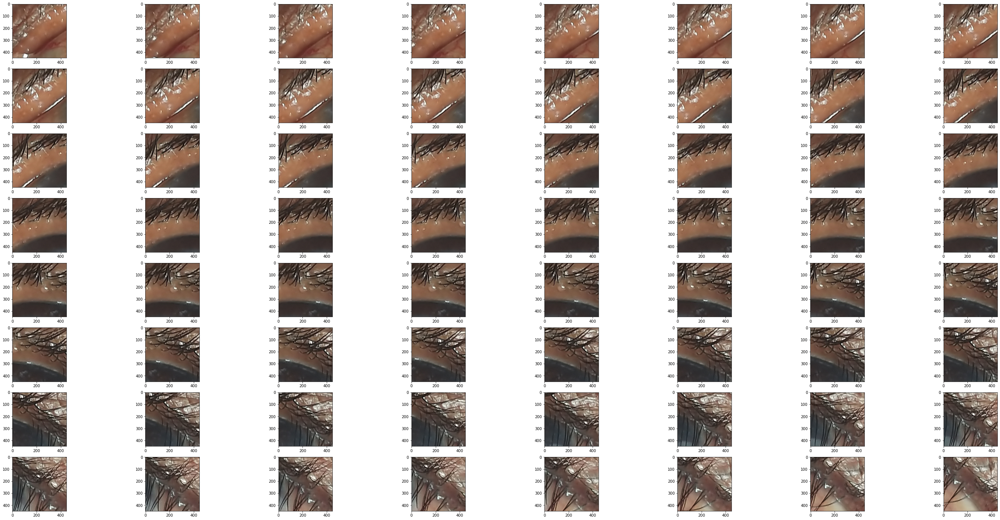

In [34]:
fig, axs = plt.subplots(8, 8, figsize=(50, 25))
for i in range(64):
    axs[int(i/8), i%8].imshow(img_np[i]/255.0)

In [6]:
model = tf.keras.models.load_model('/work/jprieto/data/remote/EGower/jprieto/trained/stack_training_08292021_2class', custom_objects={'tf': tf})
model.summary()

2021-09-01 10:52:32.957681: I tensorflow/compiler/jit/xla_cpu_device.cc:41] Not creating XLA devices, tf_xla_enable_xla_devices not set
2021-09-01 10:52:32.963319: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcuda.so.1
2021-09-01 10:52:33.024961: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:17:00.0 name: TITAN V computeCapability: 7.0
coreClock: 1.455GHz coreCount: 80 deviceMemorySize: 11.78GiB deviceMemoryBandwidth: 607.97GiB/s
2021-09-01 10:52:33.025473: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 1 with properties: 
pciBusID: 0000:65:00.0 name: Quadro P600 computeCapability: 6.1
coreClock: 1.5565GHz coreCount: 3 deviceMemorySize: 1.95GiB deviceMemoryBandwidth: 59.75GiB/s
2021-09-01 10:52:33.025495: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
2021-09-01 10:52:33.048259:

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, None, 384, 3 0                                            
__________________________________________________________________________________________________
tf.__operators__.getitem (Slici (None, None, 384, 38 0           input_2[0][0]                    
__________________________________________________________________________________________________
tf.nn.bias_add (TFOpLambda)     (None, None, 384, 38 0           tf.__operators__.getitem[0][0]   
__________________________________________________________________________________________________
time_distributed (TimeDistribut (None, None, 2048)   23587712    tf.nn.bias_add[0][0]             
______________________________________________________________________________________________

In [7]:
prediction = model.predict(np.expand_dims(data, axis=0))

2021-09-01 10:52:50.836172: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2021-09-01 10:52:50.836634: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 3600000000 Hz
2021-09-01 10:52:51.928748: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2021-09-01 10:52:52.101747: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.7


In [8]:
prediction_class, weights = prediction
print(prediction_class)

[[0.9998841]]


<AxesSubplot:>

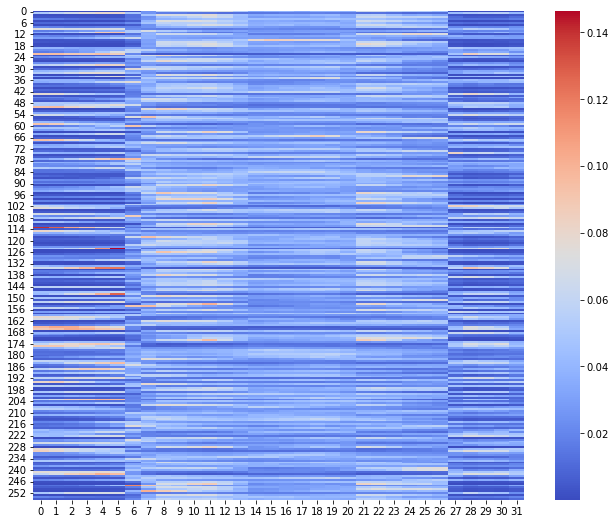

In [9]:
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.color_palette("coolwarm", as_cmap=True)
sns.heatmap(np.transpose(weights[0]), cmap=cmap)

(64, 416, 416, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

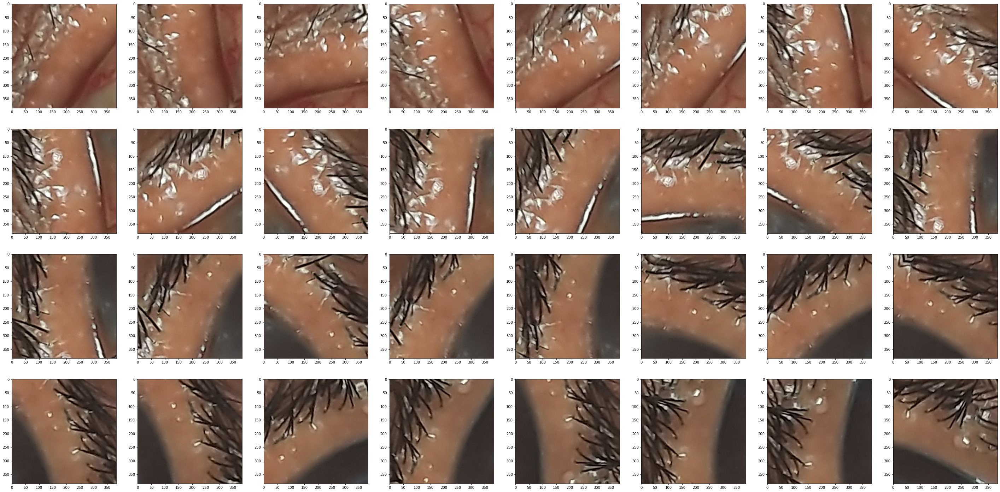

In [48]:
# degree = np.random.random() * 180 - 90 
img_np_r = np.array([ndimage.rotate(im, np.random.random() * 180 - 90, reshape=False, mode='reflect') for im in img_np])
img_np_r = img_np_r[:,16:-16,16:-16,:]
img_np_r = tf.image.random_crop(img_np_r, size=(64, 384, 384, 3))

fig, axs = plt.subplots(4, 8, figsize=(50, 25))
for i in range(32):
    axs[int(i/8), i%8].imshow(img_np_r[i]/255.0)

(32, 448, 448, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

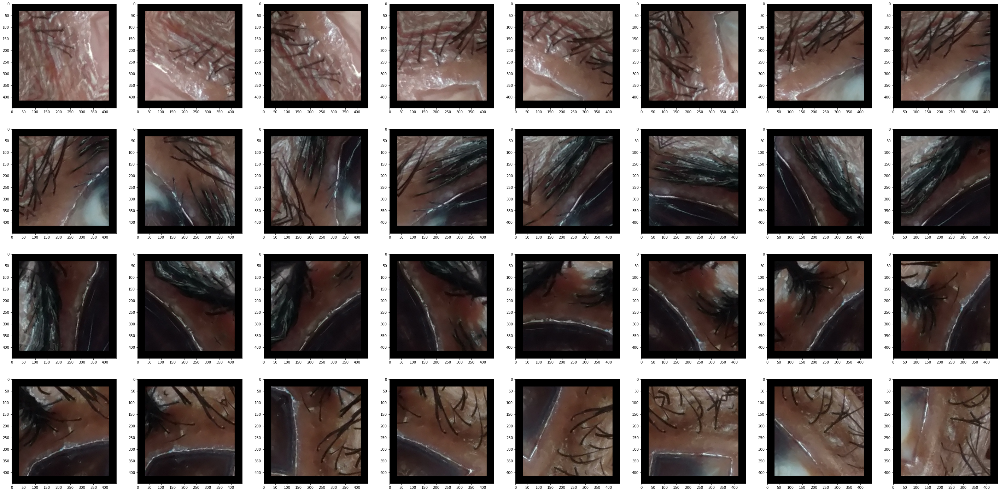

In [30]:
paddings = ((0, 0), (32, 32), (32, 32), (0, 0))
img_np_r_pad = np.pad(np.array(img_np_r), paddings, 'constant', constant_values=(0, 0))
print(img_np_r_pad.shape)

fig, axs = plt.subplots(4, 8, figsize=(50, 25))
for i in range(32):
    axs[int(i/8), i%8].imshow(img_np_r_pad[i]/255.0)